# Hao_PBMC Level 2 ACT annotation result
Your JodID: 202411072322008JSYZM4EZ7NV6S
http://xteam.xbio.top/ACT/ResultAction.action?jobID=202411072322008JSYZM4EZ7NV6S

In [1]:
from pathlib import Path

# Get the current working directory as a Path object
current_path = Path.cwd()
home_folder = 'evan_home'

# Traverse up the directory tree until you find the target folder
for parent in [current_path] + list(current_path.parents):
    if parent.name == home_folder:
        home_path = parent
        break
else:
    raise ValueError(f"Folder '{home_folder}' not found in the current working directory.")

print("Home Path:", home_path)
source_code_dir = home_path / 'Source_code'
dataset_dir = home_path / 'Dataset'


Home Path: c:\Users\evanlee\Documents\Bmi_NAS_evan\evan_home


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import os

In [3]:
annot = pd.read_csv('a2_ACT_Annotation_L2_opt_lmbd.txt', index_col=0, sep='\t')

In [4]:
annot = annot.rename(columns={'whg.overlap': 'canonical.marker.overlap', 'gsea.overlap': 'gsea.DEG.overlap'})
annot.head(12)

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap
Order,,,,,,,,,
1,Clus_ASDC,Plasmacytoid dendritic cell,5.449832e-25,3.065006e-25,0.000233,9/93,15/295,"PLAC8,SOX4,TCF4,CST3,IRF8,LILRA4,CCDC50,PLD4,H...","PLAC8,SOX4,TCF4,APP,C12orf75,IRF8,LILRA4,DAB2,..."
2,Clus_ASDC,"Plasmacytoid dendritic cell, human",2.571687e-12,3.325457e-14,NaN,3/5,0/1,"LILRA4,CCDC50,PLD4",NaN
3,Clus_ASDC,Monocyte,1.969440e-09,1.044723e-11,0.114226,9/218,12/365,"CST3,ANXA2,TXN,ALOX5AP,HLA-DPA1,MALAT1,S100A9,...","S100A10,PLAC8,CST3,SAMHD1,ANXA2,CTSH,FCGRT,ALO..."
4,Clus_ASDC,Suppressor macrophage,3.299929e-07,7.111916e-09,NaN,2/16,0/1,"CST3,S100A9",NaN
5,Clus_ASDC,CD1c-positive myeloid dendritic cell,1.426883e-04,3.690215e-06,NaN,2/15,3/35,"CST3,S100A9","CST3,HLA-DPA1,S100A9"
6,Clus_ASDC,Myeloid dendritic cell,1.792991e-04,6.182728e-06,NaN,4/63,0/1,"CST3,PLD4,HLA-DPA1,S100A9",NaN
7,Clus_ASDC,Macrophage,2.004072e-04,4.080375e-06,0.122877,6/281,18/653,"CST3,ALOX5AP,HLA-DPA1,S100A9,CD52,FTL","S100A10,PLAC8,CST3,SAMHD1,ANXA2,AXL,CTSH,FCGRT..."
8,Clus_ASDC,Classical monocyte,6.027525e-04,2.957547e-05,NaN,3/122,2/66,"PLAC8,CST3,S100A9","CST3,S100A9"
9,Clus_ASDC,Granulocyte,1.474487e-03,8.262210e-05,NaN,3/69,3/40,"TCF4,HLA-DPA1,S100A9","CST3,S100A9,FTL"


In [5]:
annot['canonical.marker.overlap'] = annot['canonical.marker.overlap'].str.split(',').fillna('')
annot['gsea.DEG.overlap'] = annot['gsea.DEG.overlap'].str.split(',').fillna('')

In [6]:
annot['union'] = annot.apply(lambda row: list(set(row['canonical.marker.overlap']) | set(row['gsea.DEG.overlap'])), axis=1)
annot.head(12)

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_ASDC,Plasmacytoid dendritic cell,5.449832e-25,3.065006e-25,0.000233,9/93,15/295,"[PLAC8, SOX4, TCF4, CST3, IRF8, LILRA4, CCDC50...","[PLAC8, SOX4, TCF4, APP, C12orf75, IRF8, LILRA...","[LILRA4, PLP2, RAB11FIP1, DAB2, ALOX5AP, APP, ..."
2,Clus_ASDC,"Plasmacytoid dendritic cell, human",2.571687e-12,3.325457e-14,NaN,3/5,0/1,"[LILRA4, CCDC50, PLD4]",,"[PLD4, CCDC50, LILRA4]"
3,Clus_ASDC,Monocyte,1.969440e-09,1.044723e-11,0.114226,9/218,12/365,"[CST3, ANXA2, TXN, ALOX5AP, HLA-DPA1, MALAT1, ...","[S100A10, PLAC8, CST3, SAMHD1, ANXA2, CTSH, FC...","[ALOX5AP, S100A10, ANXA2, CTSH, SAMHD1, FTL, H..."
4,Clus_ASDC,Suppressor macrophage,3.299929e-07,7.111916e-09,NaN,2/16,0/1,"[CST3, S100A9]",,"[CST3, S100A9]"
5,Clus_ASDC,CD1c-positive myeloid dendritic cell,1.426883e-04,3.690215e-06,NaN,2/15,3/35,"[CST3, S100A9]","[CST3, HLA-DPA1, S100A9]","[HLA-DPA1, CST3, S100A9]"
6,Clus_ASDC,Myeloid dendritic cell,1.792991e-04,6.182728e-06,NaN,4/63,0/1,"[CST3, PLD4, HLA-DPA1, S100A9]",,"[S100A9, HLA-DPA1, CST3, PLD4]"
7,Clus_ASDC,Macrophage,2.004072e-04,4.080375e-06,0.122877,6/281,18/653,"[CST3, ALOX5AP, HLA-DPA1, S100A9, CD52, FTL]","[S100A10, PLAC8, CST3, SAMHD1, ANXA2, AXL, CTS...","[AXL, DAB2, ALOX5AP, S100A10, ANXA2, RAC1, CTS..."
8,Clus_ASDC,Classical monocyte,6.027525e-04,2.957547e-05,NaN,3/122,2/66,"[PLAC8, CST3, S100A9]","[CST3, S100A9]","[PLAC8, CST3, S100A9]"
9,Clus_ASDC,Granulocyte,1.474487e-03,8.262210e-05,NaN,3/69,3/40,"[TCF4, HLA-DPA1, S100A9]","[CST3, S100A9, FTL]","[CST3, FTL, HLA-DPA1, TCF4, S100A9]"


In [7]:
annot['Cluster'].unique()

array(['Clus_ASDC', 'Clus_B_intermediate', 'Clus_B_memory',
       'Clus_B_naive', 'Clus_CD14_Mono', 'Clus_CD16_Mono', 'Clus_CD4_CTL',
       'Clus_CD4_Naive', 'Clus_CD4_Proliferating', 'Clus_CD4_TCM',
       'Clus_CD4_TEM', 'Clus_CD8_Naive', 'Clus_CD8_Proliferating',
       'Clus_CD8_TCM', 'Clus_CD8_TEM', 'Clus_cDC1', 'Clus_cDC2',
       'Clus_dnT', 'Clus_Doublet', 'Clus_Eryt', 'Clus_gdT', 'Clus_HSPC',
       'Clus_ILC', 'Clus_MAIT', 'Clus_NK', 'Clus_NK_CD56bright',
       'Clus_NK_Proliferating', 'Clus_pDC', 'Clus_Plasmablast',
       'Clus_Platelet', 'Clus_Treg'], dtype=object)

## Plot UMAP for marker genes (intersection with PreLect)

In [5]:
# adata = sc.read_h5ad('/Users/evanli/Documents/Research_datasets/PBMC_Hao/GSE164378_Hao/Harmony_noZ/Hao_Harmony_test_no_scale.h5ad')
adata = sc.read_h5ad(dataset_dir / 'PBMC_Hao/GSE164378_Hao/Harmony_noZ/Hao_Harmony_test_no_scale.h5ad')
adata.obs['celltype.l2'] = adata.obs['celltype.l2'].str.replace(' ', '_')
labels = adata.obs['celltype.l2']
types = np.unique(labels).tolist()
types

['ASDC',
 'B_intermediate',
 'B_memory',
 'B_naive',
 'CD14_Mono',
 'CD16_Mono',
 'CD4_CTL',
 'CD4_Naive',
 'CD4_Proliferating',
 'CD4_TCM',
 'CD4_TEM',
 'CD8_Naive',
 'CD8_Proliferating',
 'CD8_TCM',
 'CD8_TEM',
 'Doublet',
 'Eryth',
 'HSPC',
 'ILC',
 'MAIT',
 'NK',
 'NK_CD56bright',
 'NK_Proliferating',
 'Plasmablast',
 'Platelet',
 'Treg',
 'cDC1',
 'cDC2',
 'dnT',
 'gdT',
 'pDC']

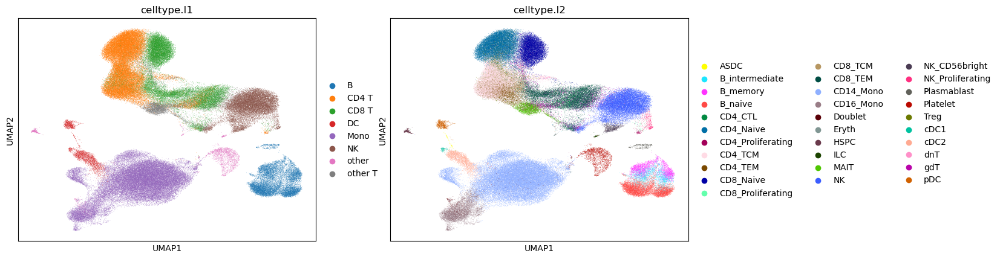

In [9]:
# UMAP embedding in adata
sc.pl.umap(adata, color=['celltype.l1', 'celltype.l2'], legend_loc="right margin")

## Plot UMAP of L2 overlapped marker genes (if celltype matched)

In [10]:
def plot_overlapped_marker_UMAP(annotation_df, clus, name):
    clus = 'Clus_' + clus
    canonical_marker_overlap = annotation_df[(annotation_df['Cluster']==clus) & (annotation_df['Cell.Type']==name)]['canonical.marker.overlap'].tolist()[0]
    sc.pl.umap(adata, color=canonical_marker_overlap, save=f'{clus}_canonical_marker_overlap_UMAP.png')

    return canonical_marker_overlap

In [11]:
def get_celltype_marker(name, marker_df):
    string = marker_df[marker_df['CellType'] == name]['Marker'].tolist()[0]
    marker_list = string.split(', ')
    return marker_list

In [12]:
clus_ACT_name_dict = {
    # 20 types
    'B_memory': 'Memory B cell',
    'B_naive': 'Naive B cell',
    'CD14_Mono': 'Classical monocyte',
    'CD16_Mono': 'Non-classical monocyte',
    'CD4_Proliferating': 'Proliferating CD4-positive, alpha-beta T cell',
    'CD4_TCM': 'Central memory CD4-positive, alpha-beta T cell',
    'CD4_TEM': 'Effector memory CD4-positive, alpha-beta T cell',
    'CD8_Naive': 'Naive thymus-derived CD8-positive, alpha-beta T cell',
    'CD8_TEM': 'Effector memory CD8-positive, alpha-beta T cell',
    'cDC1': 'Type 1 conventional dendritic cell',
    'cDC2': 'Type 2 conventional dendritic cell',
    'gdT': 'Gamma-delta T cell',
    'HSPC': 'Hematopoietic stem cell',
    'MAIT': 'Mucosal invariant T cell',
    'pDC': 'Plasmacytoid dendritic cell',
    'Treg': 'Naive regulatory T cell', # 'Regulatory T cell',
    'CD4_CTL': 'CD4-positive, alpha-beta cytotoxic T cell',
    'CD4_Naive': 'Naive thymus-derived CD4-positive, alpha-beta T cell',
    'CD8_TCM': 'Central memory CD8-positive, alpha-beta T cell',
    'Plasmablast': 'Plasmablast',
    # added
    'NK': 'Natural killer cell', 
    'NK_CD56bright' : 'Natural killer cell'
    # 'NK_CD56bright': 'CD16-negative, CD56-bright natural killer cell, human'
}


In [13]:
list(clus_ACT_name_dict.keys())[15:]

['Treg',
 'CD4_CTL',
 'CD4_Naive',
 'CD8_TCM',
 'Plasmablast',
 'NK',
 'NK_CD56bright']

## Run

Treg


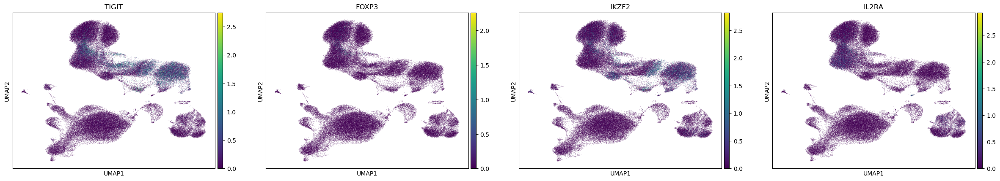

['TIGIT', 'FOXP3', 'IKZF2', 'IL2RA']
CD4_CTL


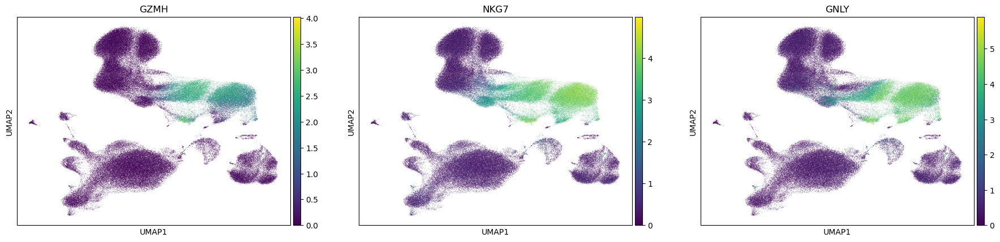

['GZMH', 'NKG7', 'GNLY']
CD4_Naive


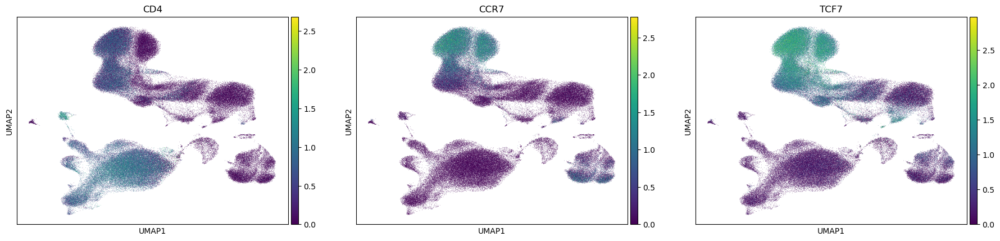

['CD4', 'CCR7', 'TCF7']
CD8_TCM


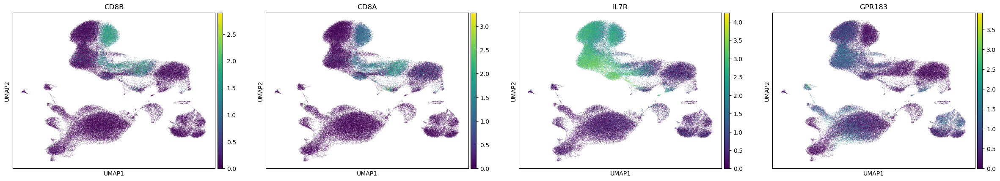

['CD8B', 'CD8A', 'IL7R', 'GPR183']
Plasmablast


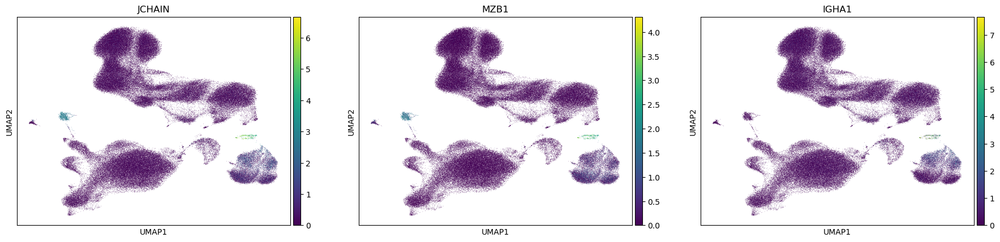

['JCHAIN', 'MZB1', 'IGHA1']
NK


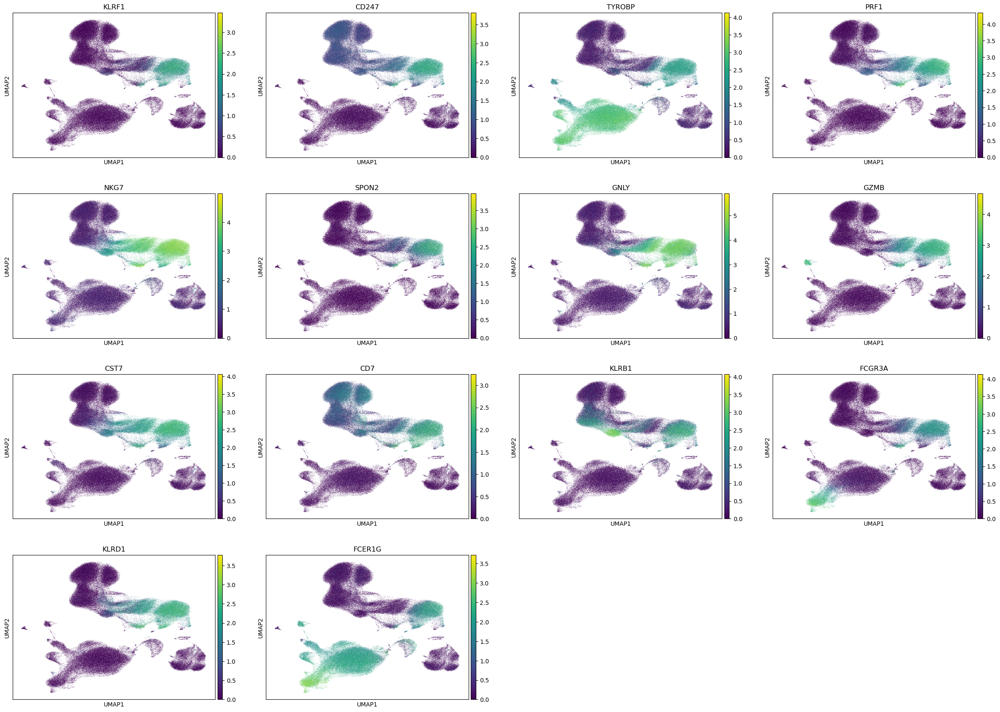

['KLRF1', 'CD247', 'TYROBP', 'PRF1', 'NKG7', 'SPON2', 'GNLY', 'GZMB', 'CST7', 'CD7', 'KLRB1', 'FCGR3A', 'KLRD1', 'FCER1G']
NK_CD56bright


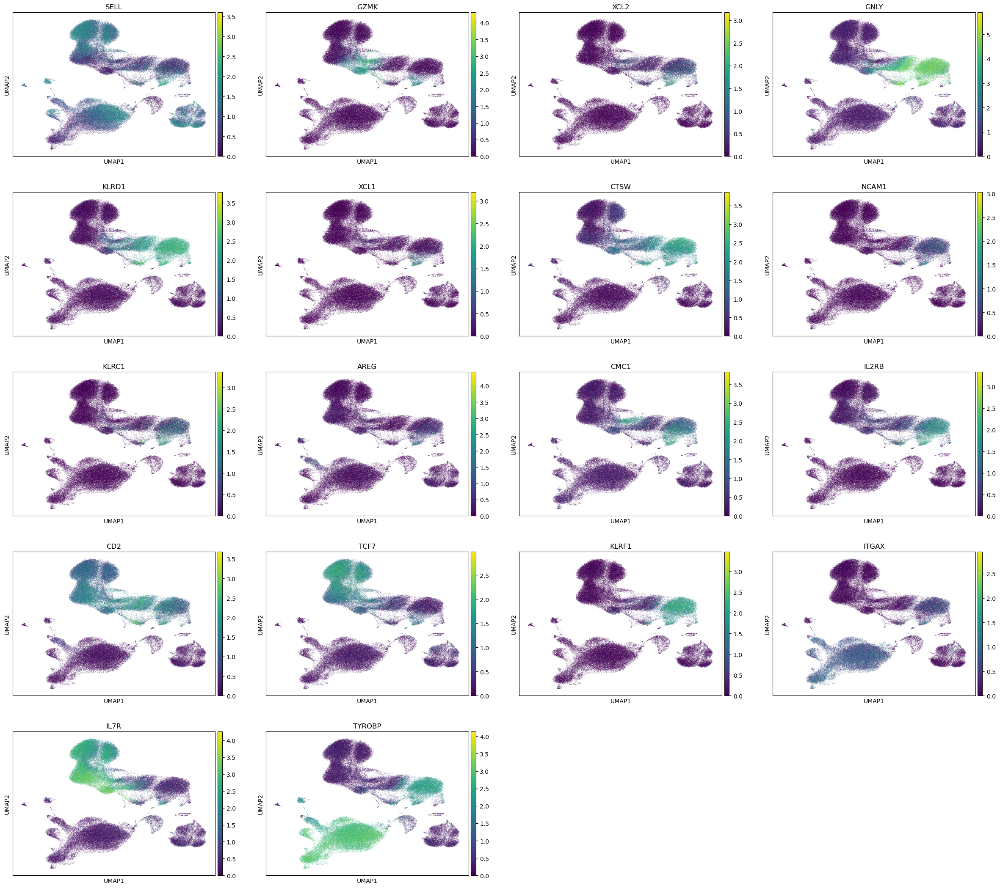

['SELL', 'GZMK', 'XCL2', 'GNLY', 'KLRD1', 'XCL1', 'CTSW', 'NCAM1', 'KLRC1', 'AREG', 'CMC1', 'IL2RB', 'CD2', 'TCF7', 'KLRF1', 'ITGAX', 'IL7R', 'TYROBP']


In [ ]:
# os.chdir('/Users/evanli/Documents/EvanPys/Progress/PBMC_Hao_batch_noZ/Level2/ACT_annotation/Overlap_UMAP_plot')
os.chdir(source_code_dir / 'PBMC_Hao_batch_noZ/Level2/ACT_annotation/Overlap_UMAP_plot')
overlapped_dict = {}
for clus, name in list(clus_ACT_name_dict.items())[15:]:  # starting from 'Treg' and onwards
    print(clus)
    canonical_marker_overlap = plot_overlapped_marker_UMAP(annot, clus, name)
    print(canonical_marker_overlap)
    overlapped_dict[clus] = canonical_marker_overlap

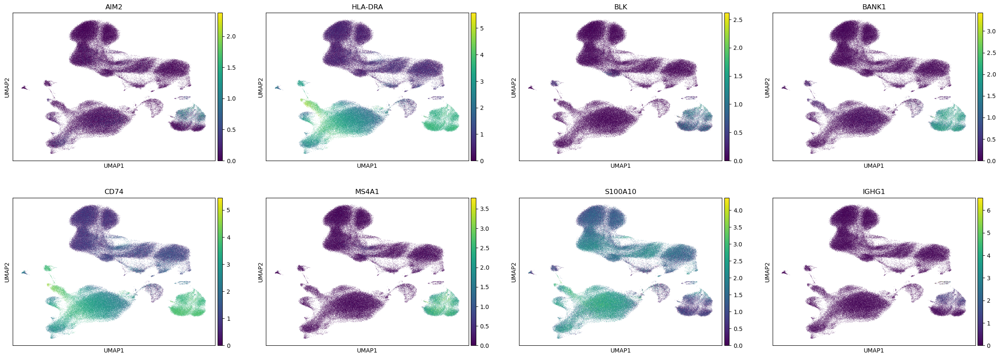

['AIM2', 'HLA-DRA', 'BLK', 'BANK1', 'CD74', 'MS4A1', 'S100A10', 'IGHG1']


In [14]:
clus = 'B_memory'
name = clus_ACT_name_dict[clus]
canonical_marker_overlap = plot_overlapped_marker_UMAP(annot, clus, name)
print(canonical_marker_overlap)

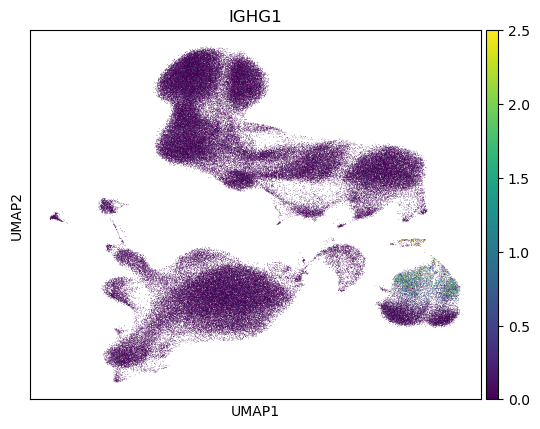

In [19]:
# Marker for B memory
sc.pl.umap(adata, color='IGHG1', vmax=2.5)

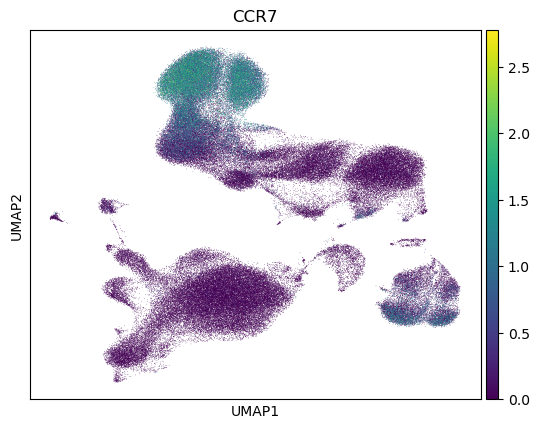

In [20]:
# Marker for CD8 Naive
sc.pl.umap(adata, color='CCR7')